# **Проект по разработке опытного образца системы искусственного интеллекта «Система оценки вовлеченности обучающихся в образовательный процесс на основе анализа статических изображений учебных аудиторий во время занятий»**

## Описание
Проект представляет собой опытный образец системы компьютерного зрения, которая по статическим изображениям учебных аудиторий во время занятий автоматически оценивает:

- посещаемость;
- вовлеченность обучающихся в образовательный процесс.

Система разрабатывается в рамках учебного задания
«Разработка программной реализации модели искусственного интеллекта как объекта техники и технологий»
по треку «Технологии искусственного интеллекта и их применение» курса
«Искусственный интеллект в высшей школе».

## Техническая реализация
Технически система реализована как двухэтапный пайплайн компьютерного зрения. На первом этапе детектор на основе архитектуры YOLOv11 (версии n/s) находит на фотографии всех обучающихся и преподавателя и оценивает посещаемость по числу обнаруженных студентов. На втором этапе для каждой найденной головы студента формируется кроп, который подаётся в лучшую из обученных архитектур классификатора (ResNet-34). Классификатор относит каждого студента к одному из классов: engaged / disengaged / unknown, после чего рассчитываются агрегированные показатели по кадру: общее число студентов, количество вовлечённых и невовлечённых, доля вовлечённых.

## Датасет и метрики
Для обучения моделей сформирован верифицированный датасет из фотографий аудиторий с разметкой в формате CVAT. Данные разделены по фотографиям на выборки train/val/test в пропорции 70/15/15, что предотвращает утечку информации между обучением и тестированием. Для детектора качество оценивается по метрикам mAP@0.5 и mAP@0.5–0.95, для классификатора — по accuracy и macro-F1 на обучающей, валидационной и тестовой выборках. Дополнительно проведён стресс-тест устойчивости классификатора к искажениям (затемнение, размытие, шум).

## Результат работы
Реализованный код обеспечивает полный цикл работы прототипа: подготовку датасета из CVAT-выгрузок, обучение и сравнение нескольких архитектур классификатора вовлечённости, обучение и оценку нескольких конфигураций YOLO-детектора, совместный инференс «детектор + классификатор» на новых изображениях, а также экспорт и визуализацию результатов. Такой подход позволяет использовать ноутбук как воспроизводимый экспериментальный стенд и как основу для дальнейшего развития системы до уровня прикладного сервиса аналитики для образовательных организаций.

# Установка библиотек и базовые импорты

In [33]:
# Установка библиотек
!pip install -q ultralytics torch torchvision opencv-python tqdm pyyaml scikit-learn matplotlib

# Загрузка библиотек
import os
import random
import shutil
from pathlib import Path

import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import yaml
from IPython.display import Markdown, display
from PIL import Image, ImageFilter
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    auc,
    classification_report,
    confusion_matrix,
    f1_score,
    roc_curve,
)
from sklearn.preprocessing import label_binarize
from torch import nn, optim
from torch.utils.data import ConcatDataset, DataLoader
from torchvision import datasets, transforms, models
from tqdm import tqdm
from ultralytics import YOLO
from google.colab import drive

def set_seed(seed: int = 42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)

set_seed(42)

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
print("Используемое устройство:", DEVICE)

Используемое устройство: cuda


# Подключение Google Drive и путей проекта

In [34]:
drive.mount('/content/drive')

PROJECT_ROOT = Path("/content/drive/MyDrive/project_alfa_future_final")

DATA_DIR = PROJECT_ROOT / "data"
DATA_DET = DATA_DIR / "detector"
DATA_ENG_RAW = DATA_DIR / "engagement"   # кропы
DATA_ENG = DATA_DIR / "engagement_split" # сплит 70/15/15
MODELS_DIR = PROJECT_ROOT / "models"

print("PROJECT_ROOT:", PROJECT_ROOT)
print("DATA_DIR существует:", DATA_DIR.exists())
print("DATA_DET:", DATA_DET, "| exists:", DATA_DET.exists())
print("DATA_ENG_RAW:", DATA_ENG_RAW, "| exists:", DATA_ENG_RAW.exists())
print("DATA_ENG (split):", DATA_ENG, "| exists:", DATA_ENG.exists())
print("MODELS_DIR:", MODELS_DIR, "| exists:", MODELS_DIR.exists())

print("\nСодержимое DATA_DIR:")
if DATA_DIR.exists():
    for p in DATA_DIR.iterdir():
        print("  ", p)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
PROJECT_ROOT: /content/drive/MyDrive/project_alfa_future_final
DATA_DIR существует: True
DATA_DET: /content/drive/MyDrive/project_alfa_future_final/data/detector | exists: True
DATA_ENG_RAW: /content/drive/MyDrive/project_alfa_future_final/data/engagement | exists: False
DATA_ENG (split): /content/drive/MyDrive/project_alfa_future_final/data/engagement_split | exists: True
MODELS_DIR: /content/drive/MyDrive/project_alfa_future_final/models | exists: True

Содержимое DATA_DIR:
   /content/drive/MyDrive/project_alfa_future_final/data/detector
   /content/drive/MyDrive/project_alfa_future_final/data/engagement_split


Некоторые папки уже существуют, поскольку код запускается не в первый раз.

# Проверяем наличие данных

In [35]:
PHOTO_DIR = PROJECT_ROOT / "photo"
CVAT_EXPORTS_DIR = PROJECT_ROOT / "cvat_exports"

print("PHOTO_DIR:", PHOTO_DIR, "| exists:", PHOTO_DIR.exists())
print("CVAT_EXPORTS_DIR:", CVAT_EXPORTS_DIR, "| exists:", CVAT_EXPORTS_DIR.exists())

if PHOTO_DIR.exists():
    print("  Кол-во файлов в photo:", len(list(PHOTO_DIR.glob('*.*'))))
if CVAT_EXPORTS_DIR.exists():
    zips = list(CVAT_EXPORTS_DIR.glob('*.zip'))
    print("  Найдено ZIP-архивов CVAT:", len(zips))
    for z in zips:
        print("   -", z.name)

PHOTO_DIR: /content/drive/MyDrive/project_alfa_future_final/photo | exists: True
CVAT_EXPORTS_DIR: /content/drive/MyDrive/project_alfa_future_final/cvat_exports | exists: True
  Кол-во файлов в photo: 530
  Найдено ZIP-архивов CVAT: 8
   - classroom_engagement_04_final.zip
   - classroom_engagement_06_final.zip
   - classroom_engagement_05_not_final.zip
   - classroom_engagement_01_final.zip
   - classroom_engagement_03_final.zip
   - classroom_engagement_02_not_final.zip
   - classroom_engagement_09_final.zip
   - classroom_engagement_07_not_final.zip


Всего в папке 530 фото. Количество размеченных из них будет понятно после разархивирования zip архивов.

# Подготовка датасета из нескольких CVAT-выгрузок

- собираем 1 датасет для детектора (student/teacher) с train/val/test
- делаем сплит по фото
- нарезаем кропы голов для классификатора вовлечённости с тем же сплитом train/val/test

In [36]:
# Расположение архивов CVAT и фото

CVAT_ZIPS_DIR = PROJECT_ROOT / "cvat_exports"  # тут zip
PHOTOS_DIR    = PROJECT_ROOT / "photo"         # тут фото в формате classroomfoto_XXXX.*

print("\nCVAT_ZIPS_DIR:", CVAT_ZIPS_DIR, "| exists:", CVAT_ZIPS_DIR.exists())
print("PHOTOS_DIR:", PHOTOS_DIR, "| exists:", PHOTOS_DIR.exists())

if not CVAT_ZIPS_DIR.exists():
    raise FileNotFoundError("Папка с архивами CVAT не найдена. Должна быть: " + str(CVAT_ZIPS_DIR))
if not PHOTOS_DIR.exists():
    raise FileNotFoundError("Папка с фотографиями не найдена. Должна быть: " + str(PHOTOS_DIR))

CVAT_EXPORT_NAMES = [
    "classroom_engagement_01_final",
    "classroom_engagement_02_not_final",
    "classroom_engagement_03_final",
    "classroom_engagement_04_final",
    "classroom_engagement_05_not_final",
    "classroom_engagement_06_final",
    "classroom_engagement_07_not_final",
    "classroom_engagement_09_final",
]

# Разархивируем экспорты (если ещё не разархивированы)

CVAT_EXPORT_DIRS = []

for name in CVAT_EXPORT_NAMES:
    zip_path = CVAT_ZIPS_DIR / f"{name}.zip"
    out_dir  = CVAT_ZIPS_DIR / name

    if not zip_path.exists():
        print(f"⚠️ Архив {zip_path} не найден, пропускаю.")
        continue

    if not out_dir.exists():
        print(f"Распаковываю {zip_path} -> {out_dir}")
        out_dir.mkdir(parents=True, exist_ok=True)

        !unzip -q "{zip_path}" -d "{out_dir}"
    else:
        print(f"{out_dir} уже существует, не распаковываю.")

    CVAT_EXPORT_DIRS.append(out_dir)

if not CVAT_EXPORT_DIRS:
    raise RuntimeError("Не найдено ни одной распакованной выгрузки CVAT.")

print("\nИспользуем экспортные папки:")
for d in CVAT_EXPORT_DIRS:
    print("  ", d)

# Поиск фото по stem (classroomfoto_0001)

IMG_EXTS = [".jpg", ".jpeg", ".png", ".JPG", ".JPEG", ".PNG"]

def find_image_by_stem(stem: str) -> Path | None:
    for ext in IMG_EXTS:
        cand = PHOTOS_DIR / f"{stem}{ext}"
        if cand.exists():
            return cand
    return None

# Чистим старые датасеты и готовим структуру папок

if DATA_DET.exists():
    print(f"\nУдаляю старый датасет детектора: {DATA_DET}")
    shutil.rmtree(DATA_DET)

if DATA_ENG.exists():
    print(f"Удаляю старый датасет классификатора (engagement_split): {DATA_ENG}")
    shutil.rmtree(DATA_ENG)

# Можно также подчистить старый root с кропами, чтобы не путаться
if DATA_ENG_RAW.exists():
    print(f"Удаляю старый root engagement (не используется): {DATA_ENG_RAW}")
    shutil.rmtree(DATA_ENG_RAW)

# detector (учитель/студент): создаём структуру под train/val/test
for split in ["train", "val", "test"]:
    (DATA_DET / "images" / split).mkdir(parents=True, exist_ok=True)
    (DATA_DET / "labels" / split).mkdir(parents=True, exist_ok=True)

# классификатор (вовлечённость): финальный сплит 70/15/15 в engagement_split
for split in ["train", "val", "test"]:
    for cls in ["engaged", "disengaged", "unknown"]:
        (DATA_ENG / split / cls).mkdir(parents=True, exist_ok=True)

# Считываем все аннотации и собираем список файлов для сплита по фото

det_items = []  # список (img_path, lbl_path, id2name)

for export_dir in CVAT_EXPORT_DIRS:
    labels_dir = export_dir / "labels" / "train"
    yaml_path  = export_dir / "data.yaml"

    if not labels_dir.exists():
        print(f"В {export_dir} нет labels/train, пропускаю.")
        continue
    if not yaml_path.exists():
        print(f"В {export_dir} нет data.yaml, пропускаю.")
        continue

    data = yaml.safe_load(yaml_path.read_text(encoding="utf-8"))
    names = data.get("names")
    if isinstance(names, dict):
        id2name = {int(k): v for k, v in names.items()}
    else:
        id2name = {i: v for i, v in enumerate(names)}

    print(f"\nОбрабатываю экспорт: {export_dir}")
    print("Классы в data.yaml:", id2name)

    label_files = sorted(labels_dir.glob("*.txt"))

    for lbl_path in tqdm(label_files, desc=f"labels in {export_dir.name}", leave=False):
        stem = lbl_path.stem  # classroomfoto_0001
        img_path = find_image_by_stem(stem)
        if img_path is None:
            print(f"Не найдено исходное фото для {stem}, пропускаю.")
            continue

        det_items.append((img_path, lbl_path, id2name))

print(f"\nВсего файлов разметки (детектор, по фото): {len(det_items)}")

# Сплит по фото: train/val/test = 70/15/15

TRAIN_RATIO_DET = 0.70
VAL_RATIO_DET   = 0.15
TEST_RATIO_DET  = 0.15

set_seed_local(42)
random.shuffle(det_items)

n_total = len(det_items)
n_train = int(TRAIN_RATIO_DET * n_total)
n_val   = int(VAL_RATIO_DET   * n_total)
n_test  = n_total - n_train - n_val

train_items = det_items[:n_train]
val_items   = det_items[n_train:n_train + n_val]
test_items  = det_items[n_train + n_val:]

print(f"\nРазбиение по фото для детектора:")
print(f"  train: {len(train_items)}")
print(f"  val:   {len(val_items)}")
print(f"  test:  {len(test_items)}")

# Записываем сплиты для YOLO-детектора (student/teacher)

def write_det_split(items, split: str):
    for img_path, lbl_path, id2name in items:
        stem = img_path.stem
        dst_img = DATA_DET / "images" / split / img_path.name
        dst_lbl = DATA_DET / "labels" / split / f"{stem}.txt"

        shutil.copy2(img_path, dst_img)

        # переписываем label-файл: 4 класса -> 2 (student / teacher)
        lines_out = []
        with open(lbl_path, "r", encoding="utf-8") as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) < 5:
                    continue
                cls_id = int(parts[0])
                cls_name = id2name.get(cls_id, "")

                if cls_name.startswith("student_"):
                    new_cls = 0  # student
                elif cls_name == "teacher":
                    new_cls = 1  # teacher
                else:
                    continue

                new_line = " ".join([str(new_cls)] + parts[1:5])
                lines_out.append(new_line)

        if lines_out:
            with open(dst_lbl, "w", encoding="utf-8") as f:
                f.write("\n".join(lines_out) + "\n")

write_det_split(train_items, "train")
write_det_split(val_items,   "val")
write_det_split(test_items,  "test")

print("\nДатасет детектора собран в:", DATA_DET)
print("images/train, images/val, images/test, labels/train, labels/val, labels/test")

# Нарезаем кропы для классификатора с тем же train/val/test по фото

crop_counts = {
    "train":      {"engaged": 0, "disengaged": 0, "unknown": 0},
    "val":        {"engaged": 0, "disengaged": 0, "unknown": 0},
    "test":       {"engaged": 0, "disengaged": 0, "unknown": 0},
}

def crop_for_items(items, split_name: str):
    for img_path, lbl_path, id2name in items:
        bgr = cv2.imread(str(img_path))
        if bgr is None:
            print(f"cv2 не смог прочитать {img_path}")
            continue
        h, w = bgr.shape[:2]

        with open(lbl_path, "r", encoding="utf-8") as f:
            lines = [ln.strip() for ln in f.readlines() if ln.strip()]

        for obj_idx, line in enumerate(lines):
            parts = line.split()
            if len(parts) < 5:
                continue
            cls_id = int(parts[0])
            cls_name = id2name.get(cls_id, "")

            # Маппинг student_* -> классы вовлечённости
            if cls_name == "student_engaged":
                out_cls = "engaged"
            elif cls_name == "student_disengaged":
                out_cls = "disengaged"
            elif cls_name == "student_unknown":
                out_cls = "unknown"
            else:

                continue

            x_c, y_c, bw, bh = map(float, parts[1:5])
            x_c *= w
            y_c *= h
            bw  *= w
            bh  *= h

            x1 = int(max(x_c - bw / 2, 0))
            y1 = int(max(y_c - bh / 2, 0))
            x2 = int(min(x_c + bw / 2, w - 1))
            y2 = int(min(y_c + bh / 2, h - 1))

            if x2 <= x1 or y2 <= y1:
                continue

            crop = bgr[y1:y2, x1:x2]

            if crop.size == 0 or crop.shape[0] < 10 or crop.shape[1] < 10:
                continue

            out_name = f"{img_path.stem}_obj{obj_idx}.jpg"
            out_path = DATA_ENG / split_name / out_cls / out_name
            cv2.imwrite(str(out_path), crop)
            crop_counts[split_name][out_cls] += 1

print("\nРежем кропы для классификатора по тем же сплитам (train/val/test)...")
crop_for_items(train_items, "train")
crop_for_items(val_items,   "val")
crop_for_items(test_items,  "test")

print("\nКропы для классификатора сохранены в:", DATA_ENG)
print("Статистика по кропам:")
for split, cls_dict in crop_counts.items():
    print(f"  {split}:")
    for cls, n in cls_dict.items():
        print(f"    {cls}: {n}")


CVAT_ZIPS_DIR: /content/drive/MyDrive/project_alfa_future_final/cvat_exports | exists: True
PHOTOS_DIR: /content/drive/MyDrive/project_alfa_future_final/photo | exists: True
/content/drive/MyDrive/project_alfa_future_final/cvat_exports/classroom_engagement_01_final уже существует, не распаковываю.
/content/drive/MyDrive/project_alfa_future_final/cvat_exports/classroom_engagement_02_not_final уже существует, не распаковываю.
/content/drive/MyDrive/project_alfa_future_final/cvat_exports/classroom_engagement_03_final уже существует, не распаковываю.
/content/drive/MyDrive/project_alfa_future_final/cvat_exports/classroom_engagement_04_final уже существует, не распаковываю.
/content/drive/MyDrive/project_alfa_future_final/cvat_exports/classroom_engagement_05_not_final уже существует, не распаковываю.
/content/drive/MyDrive/project_alfa_future_final/cvat_exports/classroom_engagement_06_final уже существует, не распаковываю.
/content/drive/MyDrive/project_alfa_future_final/cvat_exports/class


Обрабатываю экспорт: /content/drive/MyDrive/project_alfa_future_final/cvat_exports/classroom_engagement_02_not_final
Классы в data.yaml: {0: 'student_engaged', 1: 'student_disengaged', 2: 'student_unknown', 3: 'teacher'}



Обрабатываю экспорт: /content/drive/MyDrive/project_alfa_future_final/cvat_exports/classroom_engagement_03_final
Классы в data.yaml: {0: 'student_engaged', 1: 'student_disengaged', 2: 'student_unknown', 3: 'teacher'}



Обрабатываю экспорт: /content/drive/MyDrive/project_alfa_future_final/cvat_exports/classroom_engagement_04_final
Классы в data.yaml: {0: 'student_engaged', 1: 'student_disengaged', 2: 'student_unknown', 3: 'teacher'}



Обрабатываю экспорт: /content/drive/MyDrive/project_alfa_future_final/cvat_exports/classroom_engagement_05_not_final
Классы в data.yaml: {0: 'student_engaged', 1: 'student_disengaged', 2: 'student_unknown', 3: 'teacher'}



Обрабатываю экспорт: /content/drive/MyDrive/project_alfa_future_final/cvat_exports/classroom_engagement_06_final
Классы в data.yaml: {0: 'student_engaged', 1: 'student_disengaged', 2: 'student_unknown', 3: 'teacher'}



Обрабатываю экспорт: /content/drive/MyDrive/project_alfa_future_final/cvat_exports/classroom_engagement_07_not_final
Классы в data.yaml: {0: 'student_engaged', 1: 'student_disengaged', 2: 'student_unknown', 3: 'teacher'}



Обрабатываю экспорт: /content/drive/MyDrive/project_alfa_future_final/cvat_exports/classroom_engagement_09_final
Классы в data.yaml: {0: 'student_engaged', 1: 'student_disengaged', 2: 'student_unknown', 3: 'teacher'}



Всего файлов разметки (детектор, по фото): 430

Разбиение по фото для детектора:
  train: 301
  val:   64
  test:  65



Датасет детектора собран в: /content/drive/MyDrive/project_alfa_future_final/data/detector
images/train, images/val, images/test, labels/train, labels/val, labels/test

Режем кропы для классификатора по тем же сплитам (train/val/test)...

Кропы для классификатора сохранены в: /content/drive/MyDrive/project_alfa_future_final/data/engagement_split
Статистика по кропам:
  train:
    engaged: 3347
    disengaged: 2413
    unknown: 2096
  val:
    engaged: 758
    disengaged: 462
    unknown: 343
  test:
    engaged: 775
    disengaged: 688
    unknown: 388


Итого 430 фотографий для обучения, валидации и тестирования детектора и классификатора, разбиты в пропорции 75 / 15 / 15.

# Конфиг data.yaml для YOLO-детектора

In [37]:
det_yaml_path = DATA_DET / "data.yaml"

det_cfg = {
    "path": str(DATA_DET),
    "train": "images/train",
    "val":   "images/val",
    "test":  "images/test",
    "names": {0: "student", 1: "teacher"},
}

det_yaml_path.parent.mkdir(parents=True, exist_ok=True)
with open(det_yaml_path, "w", encoding="utf-8") as f:
    yaml.safe_dump(det_cfg, f, allow_unicode=True)

print("det_yaml_path:", det_yaml_path)
print(det_yaml_path.read_text(encoding="utf-8"))

det_yaml_path: /content/drive/MyDrive/project_alfa_future_final/data/detector/data.yaml
names:
  0: student
  1: teacher
path: /content/drive/MyDrive/project_alfa_future_final/data/detector
test: images/test
train: images/train
val: images/val



# Datasets и DataLoader-ы для классификатора вовлечённости

In [38]:
ENGAGEMENT_ROOT = DATA_ENG

# Аугментации для train
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

eval_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
])

train_dataset = datasets.ImageFolder(ENGAGEMENT_ROOT / "train", transform=train_transform)
val_dataset   = datasets.ImageFolder(ENGAGEMENT_ROOT / "val",   transform=eval_transform)
test_dataset  = datasets.ImageFolder(ENGAGEMENT_ROOT / "test",  transform=eval_transform)

class_names = train_dataset.classes
num_classes = len(class_names)

print("Классы классификатора:", class_names)
print(f"train samples: {len(train_dataset)}")
print(f"val   samples: {len(val_dataset)}")
print(f"test  samples: {len(test_dataset)}")

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True,  num_workers=2)
val_loader   = DataLoader(val_dataset,   batch_size=64, shuffle=False, num_workers=2)
test_loader  = DataLoader(test_dataset,  batch_size=64, shuffle=False, num_workers=2)

Классы классификатора: ['disengaged', 'engaged', 'unknown']
train samples: 7856
val   samples: 1563
test  samples: 1851


# Архитектуры классификатора и baseline на логистической регрессии

Создаём модели выбранной архитектуры:
- **ResNet18** – базовая свёрточная сеть с остаточными блоками, которая обеспечивает хорошее качество при небольшой вычислительной сложности. Она удобна как стартовая модель для отладки всего пайплайна и для сценариев с ограниченными ресурсами.

- **ResNet34** – более ёмкая модификация ResNet18, способная лучше моделировать сложные зависимости в данных при умеренном увеличении времени обучения. Это разумный компромисс между скоростью и качеством.

- **ResNet50** – глубинная архитектура с бутстрап-блоками. Её целесообразно использовать как основной высокоточный классификатор, если ресурсы GPU это позволяют.

- **MobileNet v3 Small** – высокоэффективная модель, специально разработанная для мобильных и маломощных устройств. Она обеспечивает приемлемое качество при минимальном потреблении памяти и вычислений и подходит как лёгкий вариант для реального времени.

- **EfficientNet-B0** – архитектура, оптимизированная по соотношению точность/ресурсы с помощью сбалансированного масштабирования глубины, ширины и разрешения. Она даёт качество, близкое к ResNet50, при меньшей вычислительной нагрузке и может рассматриваться как более экономичный основной классификатор.

In [39]:
def build_classifier(arch_name: str, num_classes: int):

    arch_name = arch_name.lower()

    if arch_name == "resnet18":
        weights = models.ResNet18_Weights.IMAGENET1K_V1
        base = models.resnet18(weights=weights)
        in_features = base.fc.in_features
        base.fc = nn.Linear(in_features, num_classes)

    elif arch_name == "resnet34":
        weights = models.ResNet34_Weights.IMAGENET1K_V1
        base = models.resnet34(weights=weights)
        in_features = base.fc.in_features
        base.fc = nn.Linear(in_features, num_classes)

    elif arch_name == "resnet50":
        weights = models.ResNet50_Weights.IMAGENET1K_V1
        base = models.resnet50(weights=weights)
        in_features = base.fc.in_features
        base.fc = nn.Linear(in_features, num_classes)

    elif arch_name == "mobilenet_v3_small":
        weights = models.MobileNet_V3_Small_Weights.IMAGENET1K_V1
        base = models.mobilenet_v3_small(weights=weights)
        in_features = base.classifier[-1].in_features
        base.classifier[-1] = nn.Linear(in_features, num_classes)

    elif arch_name == "efficientnet_b0":
        weights = models.EfficientNet_B0_Weights.IMAGENET1K_V1
        base = models.efficientnet_b0(weights=weights)
        in_features = base.classifier[-1].in_features
        base.classifier[-1] = nn.Linear(in_features, num_classes)

    else:
        raise ValueError(f"Неизвестная архитектура: {arch_name}")

    return base.to(DEVICE)


def extract_features_for_split(backbone, dataset, batch_size: int = 64):

    backbone.eval()
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=False, num_workers=2)

    feats_list = []
    labels_list = []

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(DEVICE)
            out = backbone(images)
            if out.ndim == 4:
                out = out.mean(dim=(2, 3))
            feats_list.append(out.cpu().numpy())
            labels_list.append(labels.numpy())

    X = np.concatenate(feats_list, axis=0)
    y = np.concatenate(labels_list, axis=0)
    return X, y


def train_logreg_baseline(backbone_arch: str = "resnet18"):

    print(f"\nБейзлайн: логистическая регрессия поверх фичей {backbone_arch}")

    # Берём ResNet и отбрасываем классификатор
    if backbone_arch == "resnet18":
        weights = models.ResNet18_Weights.IMAGENET1K_V1
        net = models.resnet18(weights=weights).to(DEVICE)
    else:
        raise NotImplementedError("Для простоты сейчас реализован бейзлайн только для resnet18")

    backbone = nn.Sequential(*list(net.children())[:-1]).to(DEVICE)
    backbone.eval()

    # Фичи для train/val/test
    X_train, y_train = extract_features_for_split(
        backbone, datasets.ImageFolder(ENGAGEMENT_ROOT / "train", transform=eval_transform)
    )
    X_val,   y_val   = extract_features_for_split(
        backbone, datasets.ImageFolder(ENGAGEMENT_ROOT / "val",   transform=eval_transform)
    )
    X_test,  y_test  = extract_features_for_split(
        backbone, datasets.ImageFolder(ENGAGEMENT_ROOT / "test",  transform=eval_transform)
    )

    print("Фичи:", X_train.shape, X_val.shape, X_test.shape)

    logreg = LogisticRegression(
        multi_class="multinomial",
        max_iter=1000,
        n_jobs=-1,
    )
    logreg.fit(X_train, y_train)

    # Метрики
    def metrics_split(X, y, title):
        y_pred = logreg.predict(X)
        acc = (y_pred == y).mean()
        f1m = f1_score(y, y_pred, average="macro")
        print(f"{title}: acc={acc:.3f}, macro-F1={f1m:.3f}")
        return acc, f1m

    train_acc, train_f1 = metrics_split(X_train, y_train, "Train")
    val_acc,   val_f1   = metrics_split(X_val,   y_val,   "Val")
    test_acc,  test_f1  = metrics_split(X_test,  y_test,  "Test")

    # Строка для общей таблицы результатов
    row = {
        "arch":           "logreg_resnet18_features",
        "train_acc":      train_acc,
        "train_f1_macro": train_f1,
        "val_acc":        val_acc,
        "val_f1_macro":   val_f1,
        "test_acc":       test_acc,
        "test_f1_macro":  test_f1,
    }

    return row

# Обучение и оценка классификаторов

- реализована ранняя остановка
- считаеем accuracy и macro-F1 на заданном loader
- строим confusion matrix
- оцениваем ROC-кривые

In [42]:
def train_classifier(
    arch_name: str,
    num_epochs: int = 20,
    lr: float = 1e-4,
    patience: int = 5,
):

    model = build_classifier(arch_name, num_classes)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode="min", factor=0.5, patience=2
    )

    best_val_loss = float("inf")
    best_state = None
    history = {
        "epoch": [],
        "train_loss": [],
        "val_loss": [],
        "train_acc": [],
        "val_acc": [],
    }

    no_improve_epochs = 0

    for epoch in range(1, num_epochs + 1):
        # train
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        for images, labels in train_loader:
            images, labels = images.to(DEVICE), labels.to(DEVICE)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * images.size(0)
            _, preds = outputs.max(1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

        train_loss = running_loss / total
        train_acc  = correct / total

        # val
        model.eval()
        running_loss = 0.0
        correct = 0
        total = 0
        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to(DEVICE), labels.to(DEVICE)
                outputs = model(images)
                loss = criterion(outputs, labels)
                running_loss += loss.item() * images.size(0)
                _, preds = outputs.max(1)
                correct += (preds == labels).sum().item()
                total += labels.size(0)

        val_loss = running_loss / total
        val_acc  = correct / total

        scheduler.step(val_loss)

        history["epoch"].append(epoch)
        history["train_loss"].append(train_loss)
        history["val_loss"].append(val_loss)
        history["train_acc"].append(train_acc)
        history["val_acc"].append(val_acc)

        print(f"[{arch_name}][{epoch:02d}/{num_epochs}] "
              f"train_loss={train_loss:.4f}, train_acc={train_acc:.3f} | "
              f"val_loss={val_loss:.4f}, val_acc={val_acc:.3f}")

        # Ранняя остановка
        if val_loss < best_val_loss - 1e-4:
            best_val_loss = val_loss
            best_state = model.state_dict()
            no_improve_epochs = 0
            print("Новый лучший чекпоинт (val_loss улучшился)")
        else:
            no_improve_epochs += 1
            if no_improve_epochs >= patience:
                print(f"Ранняя остановка после {epoch} эпох (patience={patience})")
                break

    # Сохраняем лучший чекпоинт
    out_dir = MODELS_DIR / "engagement"
    out_dir.mkdir(parents=True, exist_ok=True)
    ckpt_path = out_dir / f"engagement_{arch_name}_best.pt"
    torch.save(
        {
            "model_state_dict": best_state,
            "class_to_idx": train_dataset.class_to_idx,
            "arch_name": arch_name,
            "history": history,
        },
        ckpt_path
    )
    print(f"Лучший чекпоинт {arch_name} сохранён в {ckpt_path}")

    return ckpt_path, history


def get_split_metrics(model, loader):

    model.eval()
    y_true = []
    y_pred = []

    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(DEVICE), labels.to(DEVICE)
            outputs = model(images)
            preds = outputs.argmax(dim=1)
            y_true.extend(labels.cpu().numpy())
            y_pred.extend(preds.cpu().numpy())

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    acc = (y_true == y_pred).mean()
    f1m = f1_score(y_true, y_pred, average="macro")

    return {"acc": acc, "f1_macro": f1m}


def plot_history(history, title_prefix=""):
    epochs = history["epoch"]
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 2, 1)
    plt.plot(epochs, history["train_loss"], label="train_loss")
    plt.plot(epochs, history["val_loss"], label="val_loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"{title_prefix} Loss")
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(epochs, history["train_acc"], label="train_acc")
    plt.plot(epochs, history["val_acc"], label="val_acc")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"{title_prefix} Accuracy")
    plt.legend()

    plt.tight_layout()
    plt.show()

def load_classifier_checkpoint(ckpt_path: Path):
    ckpt = torch.load(ckpt_path, map_location=DEVICE)
    arch_name = ckpt.get("arch_name", "resnet18")
    model = build_classifier(arch_name, num_classes)
    model.load_state_dict(ckpt["model_state_dict"])
    model.eval()
    return model, ckpt

def evaluate_classifier_detailed(model, loader, class_names, title="Validation"):

    model.eval()
    y_true = []
    y_pred = []

    with torch.no_grad():
        for images, labels in loader:
            images, labels = images.to(DEVICE), labels.to(DEVICE)
            outputs = model(images)
            preds = outputs.argmax(dim=1)
            y_true.extend(labels.cpu().numpy())
            y_pred.extend(preds.cpu().numpy())

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    print(f"\n=== {title} classification report ===")
    print(classification_report(y_true, y_pred, target_names=class_names, digits=3))

    cm = confusion_matrix(y_true, y_pred)
    print("Confusion matrix:\n", cm)

    plt.figure(figsize=(5, 4))
    plt.imshow(cm, interpolation="nearest")
    plt.title(f"{title} Confusion Matrix")
    plt.colorbar()
    tick_marks = np.arange(len(class_names))
    plt.xticks(tick_marks, class_names, rotation=45)
    plt.yticks(tick_marks, class_names)

    thresh = cm.max() / 2.0
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            plt.text(
                j, i, str(cm[i, j]),
                ha="center", va="center",
                color="white" if cm[i, j] > thresh else "black",
            )

    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.show()

    return cm

def plot_roc_curves(model, loader, class_names, title="ROC"):

    model.eval()
    y_true = []
    y_score = []

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(DEVICE)
            outputs = model(images)
            probs = torch.softmax(outputs, dim=1).cpu().numpy()
            y_score.append(probs)
            y_true.append(labels.numpy())

    y_true = np.concatenate(y_true, axis=0)
    y_score = np.concatenate(y_score, axis=0)

    y_true_bin = label_binarize(y_true, classes=list(range(len(class_names))))

    plt.figure(figsize=(6, 5))
    for i, cls_name in enumerate(class_names):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_score[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"{cls_name} (AUC={roc_auc:.2f})")

    plt.plot([0, 1], [0, 1], "k--", label="random")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.show()

# Эксперименты с несколькими архитектурами классификатора


Обучаем классификатор архитектуры: resnet18
[resnet18][01/25] train_loss=0.7233, train_acc=0.684 | val_loss=0.7761, val_acc=0.656
Новый лучший чекпоинт (val_loss улучшился)
[resnet18][02/25] train_loss=0.4967, train_acc=0.798 | val_loss=0.6591, val_acc=0.727
Новый лучший чекпоинт (val_loss улучшился)
[resnet18][03/25] train_loss=0.3669, train_acc=0.862 | val_loss=0.7087, val_acc=0.733
[resnet18][04/25] train_loss=0.2696, train_acc=0.904 | val_loss=0.8277, val_acc=0.713
[resnet18][05/25] train_loss=0.1882, train_acc=0.934 | val_loss=0.8564, val_acc=0.740
[resnet18][06/25] train_loss=0.1038, train_acc=0.969 | val_loss=0.8219, val_acc=0.735
[resnet18][07/25] train_loss=0.0560, train_acc=0.984 | val_loss=0.8236, val_acc=0.752
Ранняя остановка после 7 эпох (patience=5)
Лучший чекпоинт resnet18 сохранён в /content/drive/MyDrive/project_alfa_future_final/models/engagement/engagement_resnet18_best.pt


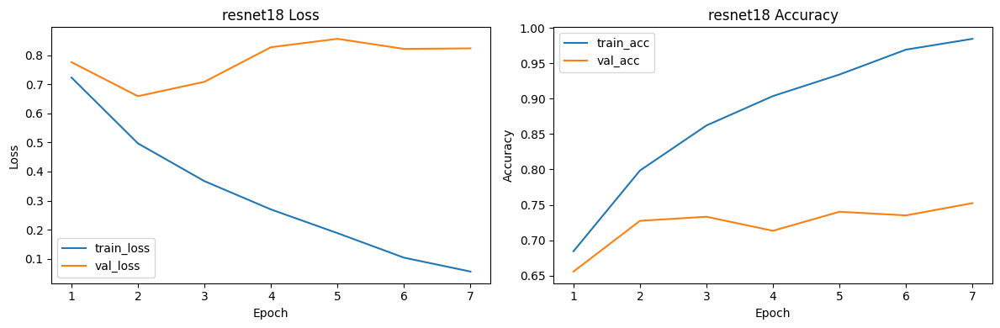


Обучаем классификатор архитектуры: resnet34
[resnet34][01/25] train_loss=0.6960, train_acc=0.699 | val_loss=0.6318, val_acc=0.733
Новый лучший чекпоинт (val_loss улучшился)
[resnet34][02/25] train_loss=0.4845, train_acc=0.809 | val_loss=0.7166, val_acc=0.704
[resnet34][03/25] train_loss=0.3655, train_acc=0.862 | val_loss=0.7341, val_acc=0.728
[resnet34][04/25] train_loss=0.2894, train_acc=0.890 | val_loss=0.8016, val_acc=0.731
[resnet34][05/25] train_loss=0.1514, train_acc=0.948 | val_loss=0.8366, val_acc=0.749
[resnet34][06/25] train_loss=0.1038, train_acc=0.968 | val_loss=0.8788, val_acc=0.759
Ранняя остановка после 6 эпох (patience=5)
Лучший чекпоинт resnet34 сохранён в /content/drive/MyDrive/project_alfa_future_final/models/engagement/engagement_resnet34_best.pt


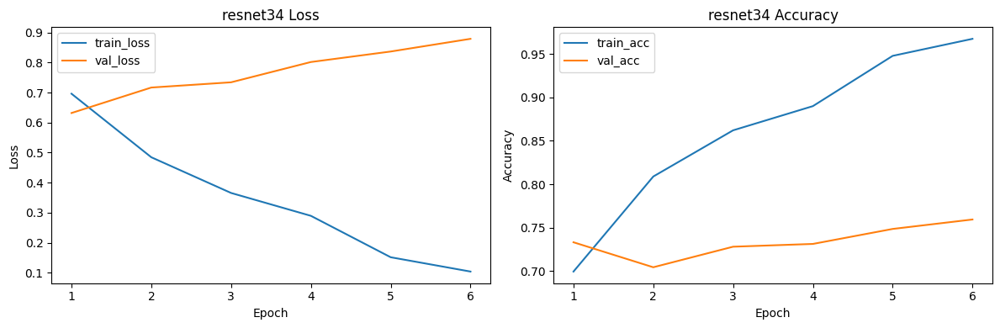


Обучаем классификатор архитектуры: resnet50
[resnet50][01/25] train_loss=0.6766, train_acc=0.711 | val_loss=0.7152, val_acc=0.708
Новый лучший чекпоинт (val_loss улучшился)
[resnet50][02/25] train_loss=0.4855, train_acc=0.806 | val_loss=0.6474, val_acc=0.753
Новый лучший чекпоинт (val_loss улучшился)
[resnet50][03/25] train_loss=0.3735, train_acc=0.858 | val_loss=0.7836, val_acc=0.710
[resnet50][04/25] train_loss=0.2847, train_acc=0.894 | val_loss=0.7125, val_acc=0.743
[resnet50][05/25] train_loss=0.2148, train_acc=0.923 | val_loss=0.8380, val_acc=0.733
[resnet50][06/25] train_loss=0.1013, train_acc=0.967 | val_loss=0.9824, val_acc=0.745
[resnet50][07/25] train_loss=0.0643, train_acc=0.979 | val_loss=1.0138, val_acc=0.738
Ранняя остановка после 7 эпох (patience=5)
Лучший чекпоинт resnet50 сохранён в /content/drive/MyDrive/project_alfa_future_final/models/engagement/engagement_resnet50_best.pt


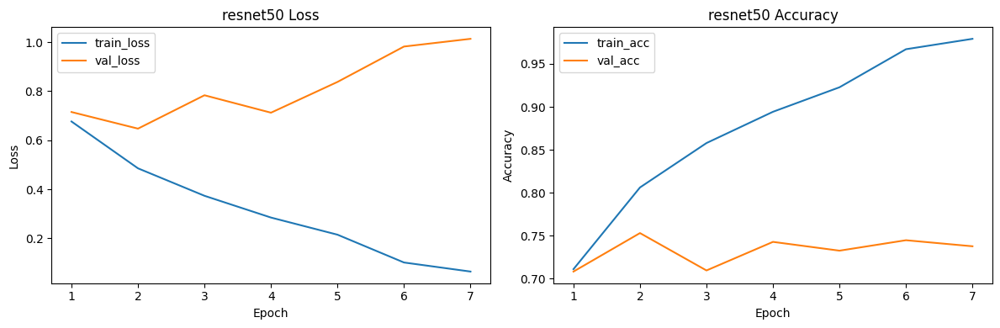


Обучаем классификатор архитектуры: mobilenet_v3_small
[mobilenet_v3_small][01/25] train_loss=0.8353, train_acc=0.598 | val_loss=0.7735, val_acc=0.628
Новый лучший чекпоинт (val_loss улучшился)
[mobilenet_v3_small][02/25] train_loss=0.6535, train_acc=0.723 | val_loss=0.7164, val_acc=0.692
Новый лучший чекпоинт (val_loss улучшился)
[mobilenet_v3_small][03/25] train_loss=0.5681, train_acc=0.766 | val_loss=0.6955, val_acc=0.707
Новый лучший чекпоинт (val_loss улучшился)
[mobilenet_v3_small][04/25] train_loss=0.5012, train_acc=0.796 | val_loss=0.6837, val_acc=0.710
Новый лучший чекпоинт (val_loss улучшился)
[mobilenet_v3_small][05/25] train_loss=0.4516, train_acc=0.814 | val_loss=0.6891, val_acc=0.725
[mobilenet_v3_small][06/25] train_loss=0.4104, train_acc=0.841 | val_loss=0.7188, val_acc=0.722
[mobilenet_v3_small][07/25] train_loss=0.3517, train_acc=0.859 | val_loss=0.7470, val_acc=0.720
[mobilenet_v3_small][08/25] train_loss=0.3003, train_acc=0.885 | val_loss=0.7626, val_acc=0.726
[mobi

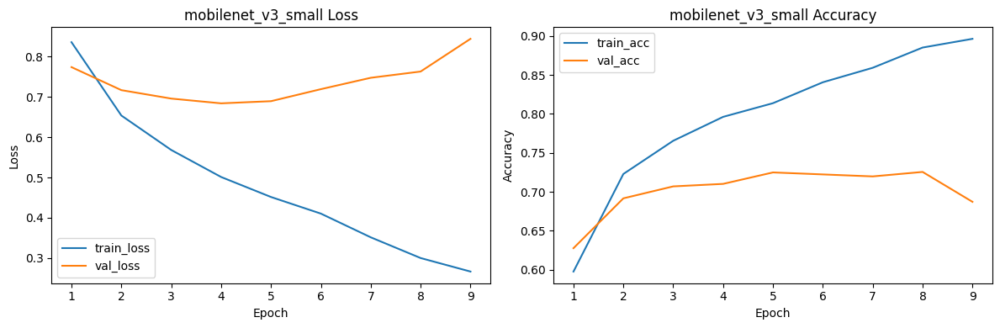


Обучаем классификатор архитектуры: efficientnet_b0
[efficientnet_b0][01/25] train_loss=0.8223, train_acc=0.624 | val_loss=0.7290, val_acc=0.670
Новый лучший чекпоинт (val_loss улучшился)
[efficientnet_b0][02/25] train_loss=0.5926, train_acc=0.751 | val_loss=0.6711, val_acc=0.716
Новый лучший чекпоинт (val_loss улучшился)
[efficientnet_b0][03/25] train_loss=0.4895, train_acc=0.800 | val_loss=0.6799, val_acc=0.717
[efficientnet_b0][04/25] train_loss=0.4005, train_acc=0.841 | val_loss=0.7293, val_acc=0.709
[efficientnet_b0][05/25] train_loss=0.3291, train_acc=0.874 | val_loss=0.7330, val_acc=0.739
[efficientnet_b0][06/25] train_loss=0.2471, train_acc=0.910 | val_loss=0.7952, val_acc=0.736
[efficientnet_b0][07/25] train_loss=0.2118, train_acc=0.922 | val_loss=0.8629, val_acc=0.718
Ранняя остановка после 7 эпох (patience=5)
Лучший чекпоинт efficientnet_b0 сохранён в /content/drive/MyDrive/project_alfa_future_final/models/engagement/engagement_efficientnet_b0_best.pt


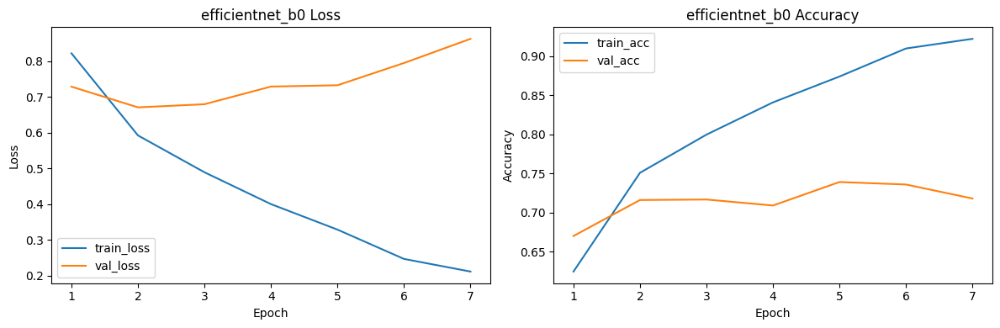


Бейзлайн: логистическая регрессия поверх фичей resnet18
Фичи: (7856, 512) (1563, 512) (1851, 512)


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Train: acc=0.738, macro-F1=0.732
Val: acc=0.617, macro-F1=0.606
Test: acc=0.646, macro-F1=0.640

Итоги экспериментов по классификаторам (включая бейзлайн)


,arch,train_acc,train_f1_macro,val_acc,val_f1_macro,test_acc,test_f1_macro
0,resnet18,0.993763,0.993608,0.752399,0.734358,0.749865,0.743628
1,resnet34,0.986380,0.985999,0.759437,0.748116,0.766072,0.761657
2,resnet50,0.990835,0.990835,0.737684,0.732594,0.741221,0.739079
3,mobilenet_v3_small,0.921843,0.920423,0.687140,0.683100,0.724473,0.723437
4,efficientnet_b0,0.967923,0.966047,0.717850,0.704983,0.759589,0.755819
5,logreg_resnet18_features,0.738162,0.731602,0.617402,0.606474,0.645597,0.640079


In [43]:
ARCH_EXPERIMENTS = [
    {"arch": "resnet18",           "epochs": 25, "lr": 1e-4},
    {"arch": "resnet34",           "epochs": 25, "lr": 1e-4},
    {"arch": "resnet50",           "epochs": 25, "lr": 1e-4},
    {"arch": "mobilenet_v3_small", "epochs": 25, "lr": 1e-4},
    {"arch": "efficientnet_b0",    "epochs": 25, "lr": 1e-4},
]

clf_results = []

for cfg in ARCH_EXPERIMENTS:
    arch = cfg["arch"]
    epochs = cfg["epochs"]
    lr = cfg["lr"]

    print("\n" + "=" * 60)
    print(f"Обучаем классификатор архитектуры: {arch}")
    print("=" * 60)

    ckpt_path, history = train_classifier(arch, num_epochs=epochs, lr=lr, patience=5)
    plot_history(history, title_prefix=arch)

    model, _ = load_classifier_checkpoint(ckpt_path)

    m_train = get_split_metrics(model, train_loader)
    m_val   = get_split_metrics(model, val_loader)
    m_test  = get_split_metrics(model, test_loader)

    row = {
        "arch":           arch,
        "train_acc":      m_train["acc"],
        "train_f1_macro": m_train["f1_macro"],
        "val_acc":        m_val["acc"],
        "val_f1_macro":   m_val["f1_macro"],
        "test_acc":       m_test["acc"],
        "test_f1_macro":  m_test["f1_macro"],
    }
    clf_results.append(row)

# Добавляем бейзлайн на логистической регрессии по фичам ResNet18
logreg_row = train_logreg_baseline(backbone_arch="resnet18")
clf_results.append(logreg_row)

clf_results_df = pd.DataFrame(clf_results)
print("\nИтоги экспериментов по классификаторам (включая бейзлайн)")
display(clf_results_df)

- **ResNet18**. Быстро сходится: за ~7 эпох train_acc ≈ 0.99, val_acc ≈ 0.75. Разрыв train/val небольшой, валид. loss сначала падает, потом чуть растёт - лёгкое, но контролируемое переобучение, ранняя остановка сработала вовремя. Модель даёт приличное качество и служит хорошим базовым вариантом.

- **ResNet34**. Ведёт себя очень похоже на resnet18, но val accuracy и F1 чуть выше (val_acc ≈ 0.76). Кривые loss и accuracy гладкие, без рывков, разрыв между train и val умеренный. То есть модель чуть лучше использует данные, не уходя в сильное переобучение.

- **ResNet50**. Даёт самый высокий val_f1 и один из лучших test_f1, при этом train_acc тоже почти 1.0. Гэп между train и val заметен, но не сильный, ранняя остановка отрубила обучение до того, как модель ушла в сильный оверфит. Сейчас это лучший классификатор по качеству.

- **MobileNet v3 small**. Обучается стабильно, но train_acc ниже (≈0.89), а val/test чуть хуже остальных (val_acc ≈0.72). Разрыв train/val есть, но не огромный. В целом видно, что это лёгкая модель: качество немного проседает, но взамен она самая компактная и быстрая.

- **EfficientNet-B0**. Показывает результаты на уровне лучших ResNet-ов: train_acc ≈0.97, val/test около 0.75–0.76. Кривые loss аккуратные, разрыв train/val близок к resnet34/50. То есть это ещё один сильный кандидат, особенно если важен баланс между качеством и эффективностью.

- **Итого**: все сверточные сети (ResNet18/34/50, MobileNet, EfficientNet) заметно лучше логистической регрессии по фичам (у бейзлайна test_acc ≈0.64 против ≈0.72–0.76 у нейросетей). Лидерами выглядят resnet34, resnet50 и efficientnet_b0, причём resnet50 чуть впереди по F1 на валидации и тесте, а переобучение нигде не выходит за разумные рамки благодаря ранней остановке и раздельному train/val/test.

# Выбор лучшего классификатора и детальная оценка

Нейросетевые модели оценим по следующим метрикам:
- train_acc - это доля правильно угаданных классов на обучающем наборе (train). Она показывает, насколько хорошо модель выучила тренировочные данные. Если train_acc очень высокий (около 1), а на валидации и тесте заметно ниже - это сигнал переобучения: модель запомнила примеры, но плохо обобщает.
- val_acc - точность на валидационном наборе (val), на котором модель не училась. По этой метрике мы во время обучения выбираем гиперпараметры и лучшую архитектуру: чем выше val_acc (и val_f1_macro), тем более «общей» кажется модель.
- test_acc - точность на тестовом наборе (test), который не участвовал ни в обучении, ни в подборе гиперпараметров.
- train_f1_macro / val_f1_macro / test_f1_macro — это F1-метрика, посчитанная отдельно для каждого класса и затем усреднённая по классам (macro). В отличие от accuracy, она учитывает дисбаланс классов: если, например, «engaged» встречается чаще, чем «disengaged» и «unknown», высокая accuracy может скрывать, что редкий класс распознаётся плохо. macro-F1 «даёт одинаковый вес» каждому классу, поэтому хорошо показывает, насколько модель справляется со всеми типами вовлечённости, а не только с доминирующим классом.

Лучший классификатор по val_f1_macro:


,arch,train_acc,train_f1_macro,val_acc,val_f1_macro,test_acc,test_f1_macro
1,resnet34,0.98638,0.985999,0.759437,0.748116,0.766072,0.761657


Чекпоинт лучшего классификатора: /content/drive/MyDrive/project_alfa_future_final/models/engagement/engagement_resnet34_best.pt | exists: True

=== Train (resnet34) classification report ===
              precision    recall  f1-score   support

  disengaged      0.992     0.981     0.986      2413
     engaged      0.989     0.992     0.991      3347
     unknown      0.980     0.988     0.984      2096

    accuracy                          0.988      7856
   macro avg      0.987     0.987     0.987      7856
weighted avg      0.988     0.988     0.988      7856

Confusion matrix:
 [[2367   20   26]
 [  10 3321   16]
 [   9   16 2071]]


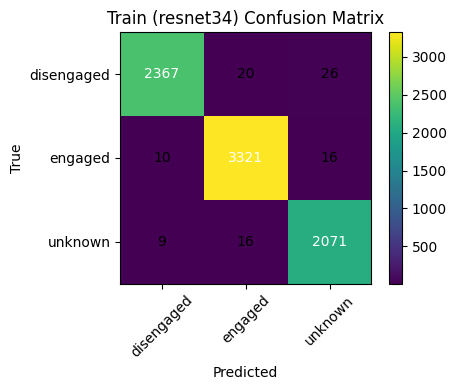


=== Val (resnet34) classification report ===
              precision    recall  f1-score   support

  disengaged      0.715     0.602     0.653       462
     engaged      0.805     0.807     0.806       758
     unknown      0.717     0.866     0.785       343

    accuracy                          0.759      1563
   macro avg      0.746     0.758     0.748      1563
weighted avg      0.759     0.759     0.756      1563

Confusion matrix:
 [[278 123  61]
 [ 90 612  56]
 [ 21  25 297]]


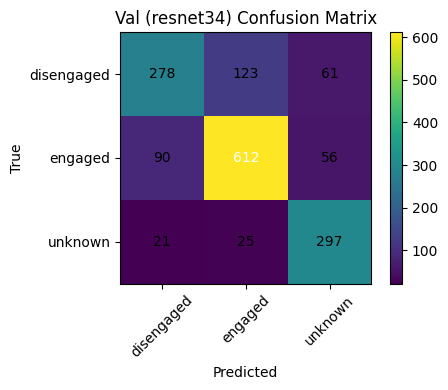


=== Test (resnet34) classification report ===
              precision    recall  f1-score   support

  disengaged      0.796     0.645     0.713       688
     engaged      0.780     0.840     0.809       775
     unknown      0.705     0.832     0.764       388

    accuracy                          0.766      1851
   macro avg      0.760     0.773     0.762      1851
weighted avg      0.770     0.766     0.764      1851

Confusion matrix:
 [[444 161  83]
 [ 72 651  52]
 [ 42  23 323]]


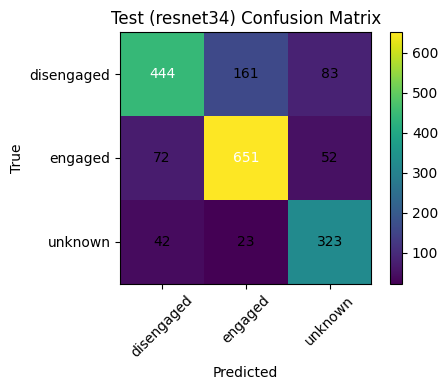


=== All (resnet34) classification report ===
              precision    recall  f1-score   support

  disengaged      0.922     0.865     0.892      3563
     engaged      0.923     0.935     0.929      4880
     unknown      0.900     0.950     0.925      2827

    accuracy                          0.917     11270
   macro avg      0.915     0.917     0.916     11270
weighted avg      0.917     0.917     0.917     11270

Confusion matrix:
 [[3081  314  168]
 [ 186 4565  129]
 [  75   65 2687]]


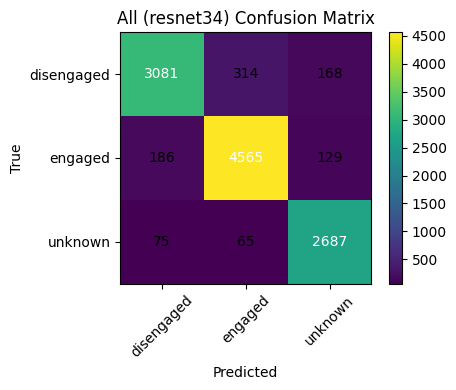

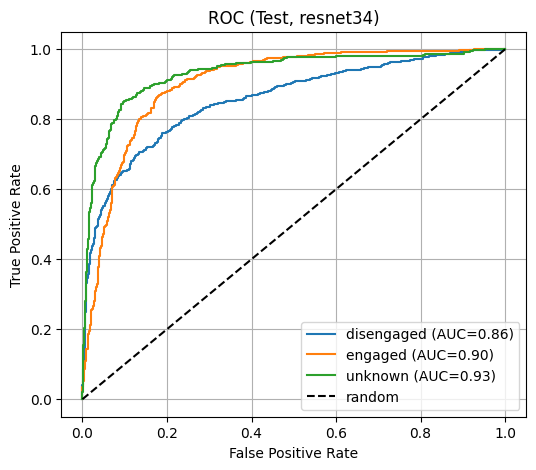

In [44]:
# Фильтруем только настоящие нейросетевые модели (без логистического бейзлайна),
df_nn = clf_results_df[~clf_results_df["arch"].str.startswith("logreg")].copy()

best_row = df_nn.sort_values("val_f1_macro", ascending=False).iloc[0]
best_arch = best_row["arch"]

print("Лучший классификатор по val_f1_macro:")
display(best_row.to_frame().T)

best_ckpt_path = MODELS_DIR / "engagement" / f"engagement_{best_arch}_best.pt"
print("Чекпоинт лучшего классификатора:", best_ckpt_path, "| exists:", best_ckpt_path.exists())

best_model, best_ckpt = load_classifier_checkpoint(best_ckpt_path)

# Подробная оценка на train/val/test
cm_train = evaluate_classifier_detailed(best_model, train_loader, class_names, title=f"Train ({best_arch})")
cm_val   = evaluate_classifier_detailed(best_model, val_loader,   class_names, title=f"Val ({best_arch})")
cm_test  = evaluate_classifier_detailed(best_model, test_loader,  class_names, title=f"Test ({best_arch})")

# "All" = train+val+test
all_dataset = ConcatDataset([train_dataset, val_dataset, test_dataset])
all_loader  = DataLoader(all_dataset, batch_size=64, shuffle=False, num_workers=2)
evaluate_classifier_detailed(best_model, all_loader, class_names, title=f"All ({best_arch})")

# ROC-кривые по лучшему классификатору на тесте
plot_roc_curves(best_model, test_loader, class_names, title=f"ROC (Test, {best_arch})")

- **train**: точность ≈0.99 и macro-F1 ≈0.99 - модель почти идеально подстраивается под обучающую выборку. Почти все объекты трёх классов попадают в верные ячейки confusion matrix, ошибок очень мало. Это признак того, что модель имеет запас мощности относительно размера тренировочного датасета и уже «выучила» его.

- **val**: на валидации метрики падают до accuracy ≈0.76 и macro-F1 ≈0.75. По confusion matrix видно, что хуже всего распознаётся класс disengaged: часть «невовлечённых» уезжает в engaged и unknown. Класс engaged распознаётся лучше остальных, unknown - на среднем уровне. Разрыв между train и val есть, но он умеренный, то есть есть некоторое переобучение, но не катастрофическое.

- **test**: на тесте картина похожа на валидацию: accuracy ≈0.76, macro-F1 ≈0.76, пер-классовые F1 почти такие же. Это главное: поведение на unseen-данных такое же, как на val, значит, мы не подогнали модель под валидацию, и оценка качества реалистична.

- **All (train+val+test)**: accuracy ≈0.92 и macro-F1 ≈0.92. В целом по всем данным модель работает хорошо, но для честной оценки нас больше интересуют val и test.

- **ROC-кривые** на тесте выглядят сильными: AUC ≈0.86 для disengaged, ≈0.90 для engaged и ≈0.93 для unknown. Это значит, что если подбирать порог классификации, модель достаточно устойчиво разделяет классы по уверенности, особенно хорошо — класс unknown.

- **Итого**: ResNet34 даёт адекватное качество - почти идеальное на train и устойчивые ~0.75 macro-F1 на валидации и тесте, без явного завала по какому-то одному классу (хотя disengaged самый сложный). Модель чуть-чуть переобучается, но в рамках нормы, а согласованность val и test говорит, что мы получили честную оценку и можем использовать ResNet34 как основной классификатор вовлечённости.

# Функции обучения и оценки YOLO-детекторов

Мы используем YOLO-детектор, потому что нам сначала нужно быстро и надёжно найти на фотографии всех людей (student/teacher) и вырезать их области, а уже потом классифицировать вовлечённость по кропам. YOLO даёт современное качество детекции при высокой скорости. Варианты yolo11n и yolo11s выбраны как лёгкие и средние модели: они достаточно мощные для нашего размера датасета, но при этом быстро обучаются и хорошо помещаются в доступный GPU.

Выбор метрик:
- **val_mAP50** - это средняя по классам точность обнаружения объектов при пороге IoU = 0.5 (перекрытие предсказанного и истинного прямоугольников не меньше 50 %). То есть модель угадала объект, если её рамка достаточно близко совпала с разметкой. Эта метрика показывает, насколько хорошо детектор в целом умеет находить нужные объекты без очень строгих требований к точности границ.

- **val_mAP50-95** - усредняет mAP по нескольким порогам IoU (обычно 0.50, 0.55, …, 0.95). Таким образом, модель должна быть хорошей и при мягких, и при очень строгих требованиях к совпадению рамок с разметкой. Эта метрика считается более строгой и даёт целостную оценку качества детектора, поэтому именно по ней удобно сравнивать разные модели.

- **val_precision (precision)** - показывает долю корректных предсказаний среди всех предсказанных объектов: из всех рамок, которые нарисовала модель, какая часть действительно соответствует реальным объектам. Высокая точность означает мало ложных срабатываний, то есть модель почти не «выдумывает» студентов или преподавателей там, где их нет.

- **val_recall (recall)** - показывает долю найденных объектов среди всех реально существующих: из всех студентов и преподавателей на изображении какую часть модель действительно обнаружила. Высокая полнота означает, что детектор практически никого не пропускает, что важно для нашей задачи, чтобы вовлечённость оценивалась для максимального числа людей в кадре.

In [45]:
def train_yolo_detector(
    model_name: str,
    run_name: str,
    epochs: int = 40,
    batch: int = 16,
    imgsz: int = 640,
):

    yolo_project_dir = MODELS_DIR / "detector"
    yolo_project_dir.mkdir(parents=True, exist_ok=True)

    print(f"\n=== Обучаем детектор {model_name}, run_name={run_name} ===")
    !yolo task=detect mode=train \
      model={model_name} \
      data="{det_yaml_path}" \
      epochs={epochs} imgsz={imgsz} batch={batch} workers=2 device=0 \
      project="{yolo_project_dir}" \
      name="{run_name}"

def evaluate_yolo_detector(run_name: str):
    """
    Запускает валидацию yolo mode=val и читает metrics из results.csv.
    Возвращает словарь с mAP50, mAP50-95, precision, recall (по val-сплиту).
    """
    yolo_project_dir = MODELS_DIR / "detector"
    run_dir = yolo_project_dir / run_name
    best_weights = run_dir / "weights" / "best.pt"

    print(f"\n=== Валидация детектора {run_name} (val-сплит) ===")
    !yolo task=detect mode=val \
      model="{best_weights}" \
      data="{det_yaml_path}" \
      imgsz=640 device=0

    results_csv = run_dir / "results.csv"
    if not results_csv.exists():
        print("results.csv не найден:", results_csv)
        return None

    df = pd.read_csv(results_csv)
    last = df.iloc[-1]
    metrics = {
        "run_name":      run_name,
        "val_mAP50":     float(last["metrics/mAP50(B)"]),
        "val_mAP50-95":  float(last["metrics/mAP50-95(B)"]),
        "val_precision": float(last["metrics/precision(B)"]),
        "val_recall":    float(last["metrics/recall(B)"]),
    }
    print("Метрики валидации:", metrics)
    return metrics

# Эксперименты с YOLO-детекторами

In [46]:
DETECTOR_EXPERIMENTS = [
    {"model_name": "yolo11n.pt", "run_name": "student_teacher_yolo11n", "epochs": 40, "batch": 16},
    {"model_name": "yolo11s.pt", "run_name": "student_teacher_yolo11s", "epochs": 40, "batch": 16},
]

det_results = []

for cfg in DETECTOR_EXPERIMENTS:
    model_name = cfg["model_name"]
    run_name   = cfg["run_name"]
    epochs     = cfg["epochs"]
    batch      = cfg["batch"]

    train_yolo_detector(
        model_name=model_name,
        run_name=run_name,
        epochs=epochs,
        batch=batch,
        imgsz=640,
    )

    m = evaluate_yolo_detector(run_name)
    if m is not None:
        det_results.append(m)

det_results_df = pd.DataFrame(det_results)
print("\n=== Итоги экспериментов по детекторам ===")
display(det_results_df)


=== Обучаем детектор yolo11n.pt, run_name=student_teacher_yolo11n ===
Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/project_alfa_future_final/data/detector/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=40, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=student_teach

,run_name,val_mAP50,val_mAP50-95,val_precision,val_recall
0,student_teacher_yolo11n,0.77884,0.43598,0.88418,0.72215
1,student_teacher_yolo11s,0.78602,0.45293,0.90523,0.72041


- **Модель yolo11n**: детектор показывает хорошие результаты на валидации - mAP@0.5 ≈ 0.78, mAP@0.5–0.95 ≈ 0.44, precision ≈ 0.88, recall ≈ 0.72. То есть он довольно уверенно находит и студентов, и преподавателя, при этом делает сравнительно немного ложных срабатываний (высокая точность) и не так много реальных объектов пропускает (достаточно высокий recall).

- **Модель yolo11s**: показатели ещё немного выше - mAP@0.5 ≈ 0.79, mAP@0.5–0.95 ≈ 0.45, precision ≈ 0.91 при похожем recall ≈ 0.72. Это значит, что «s»-версия лучше локализует объекты (чуть выше mAP) и даёт меньше ложных детекций (precision выше), сохраняя при этом ту же способность находить реальные объекты.

- **Итого**: обе модели обучились успешно и дают сопоставимые результаты, но yolo11s стабильно лучше по ключевым метрикам (mAP и precision) при той же полноте. Поэтому в качестве основного детектора для проекта логично выбирать student_teacher_yolo11s как более качественную модель, а yolo11n можно рассматривать как более лёгкий резервный вариант.

# Выбор лучшего детектора + совместный инференс с лучшим классификатором

Лучший детектор по val_mAP50-95:


,run_name,val_mAP50,val_mAP50-95,val_precision,val_recall
1,student_teacher_yolo11s,0.78602,0.45293,0.90523,0.72041


BEST_DETECTOR_WEIGHTS: /content/drive/MyDrive/project_alfa_future_final/models/detector/student_teacher_yolo11s/weights/best.pt | exists: True
BEST_CLASSIFIER_CKPT: /content/drive/MyDrive/project_alfa_future_final/models/engagement/engagement_resnet34_best.pt | exists: True
Классы классификатора: {0: 'disengaged', 1: 'engaged', 2: 'unknown'}
Тестовых изображений (детектор): 65
Случайно выбрано 1 изображений из test:
   /content/drive/MyDrive/project_alfa_future_final/data/detector/images/test/classroomfoto_0023.jpg

=== Анализ изображения: /content/drive/MyDrive/project_alfa_future_final/data/detector/images/test/classroomfoto_0023.jpg ===

Всего студентов (детектор): 152
  engaged:    69
  disengaged: 43
  unknown:    40
Доля вовлечённых среди всех студентов:          0.454
Доля вовлечённых среди оценённых (без unknown): 0.616


**Файл:** `classroomfoto_0023.jpg`

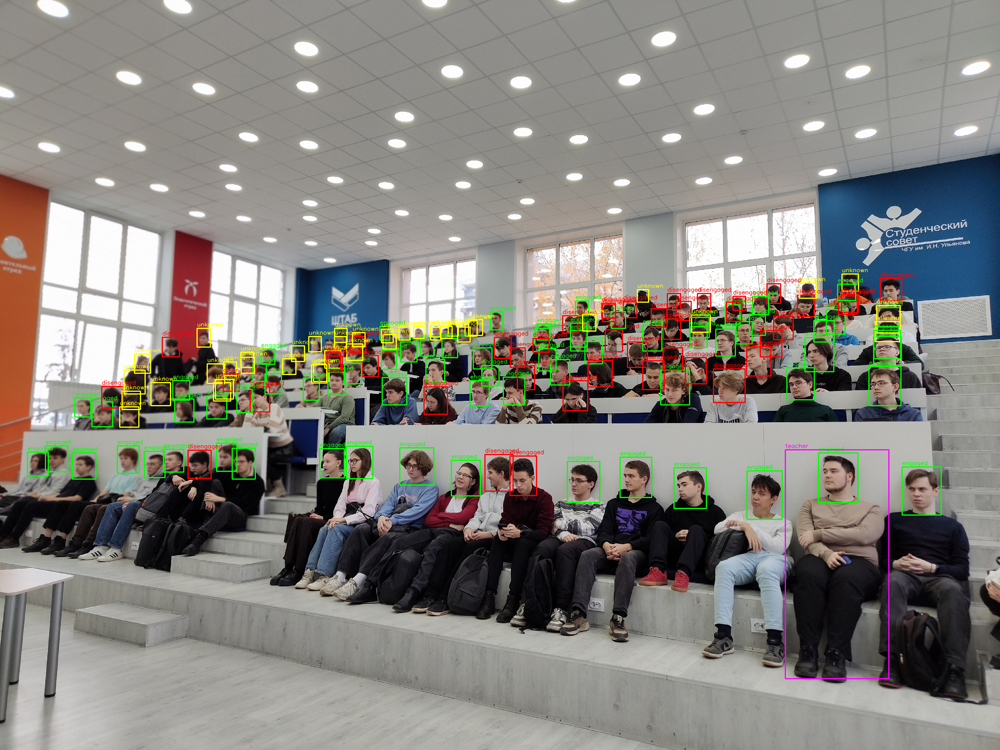


CUSTOM_INFER_DIR: /content/drive/MyDrive/project_alfa_future_final/inference_images | exists: True
Пользовательских изображений: 2

=== Анализ изображения: /content/drive/MyDrive/project_alfa_future_final/inference_images/classroomfoto_0492.jpg ===

Всего студентов (детектор): 19
  engaged:    13
  disengaged: 3
  unknown:    3
Доля вовлечённых среди всех студентов:          0.684
Доля вовлечённых среди оценённых (без unknown): 0.812


**Файл:** `classroomfoto_0492.jpg`

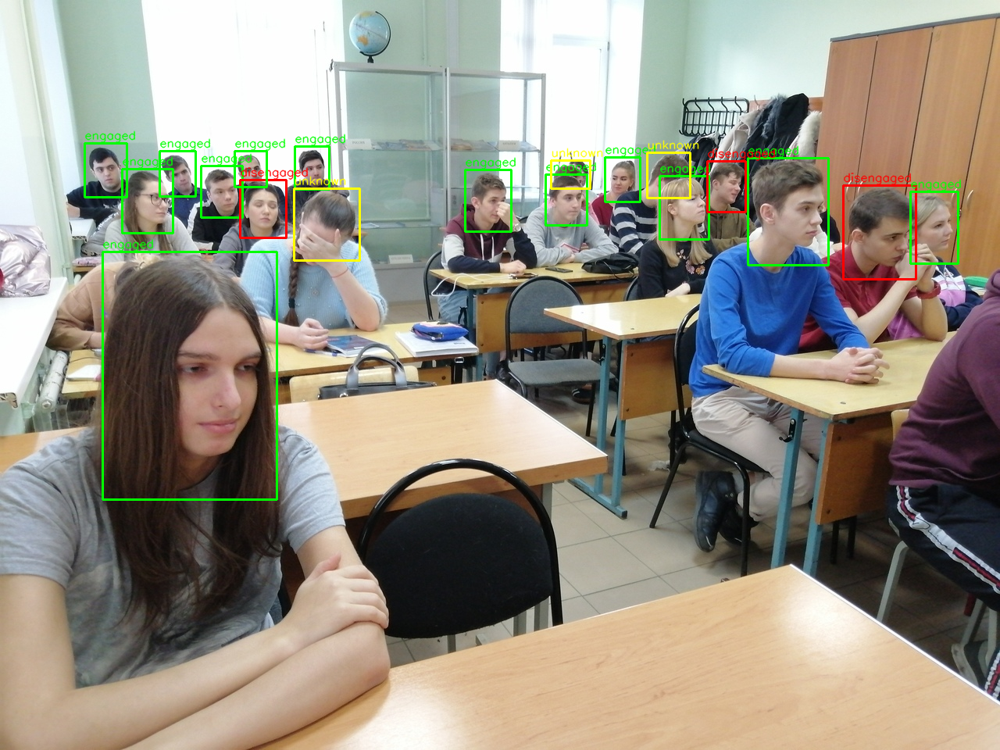


=== Анализ изображения: /content/drive/MyDrive/project_alfa_future_final/inference_images/classroomfoto_0503.jpg ===

Всего студентов (детектор): 42
  engaged:    38
  disengaged: 2
  unknown:    2
Доля вовлечённых среди всех студентов:          0.905
Доля вовлечённых среди оценённых (без unknown): 0.950


**Файл:** `classroomfoto_0503.jpg`

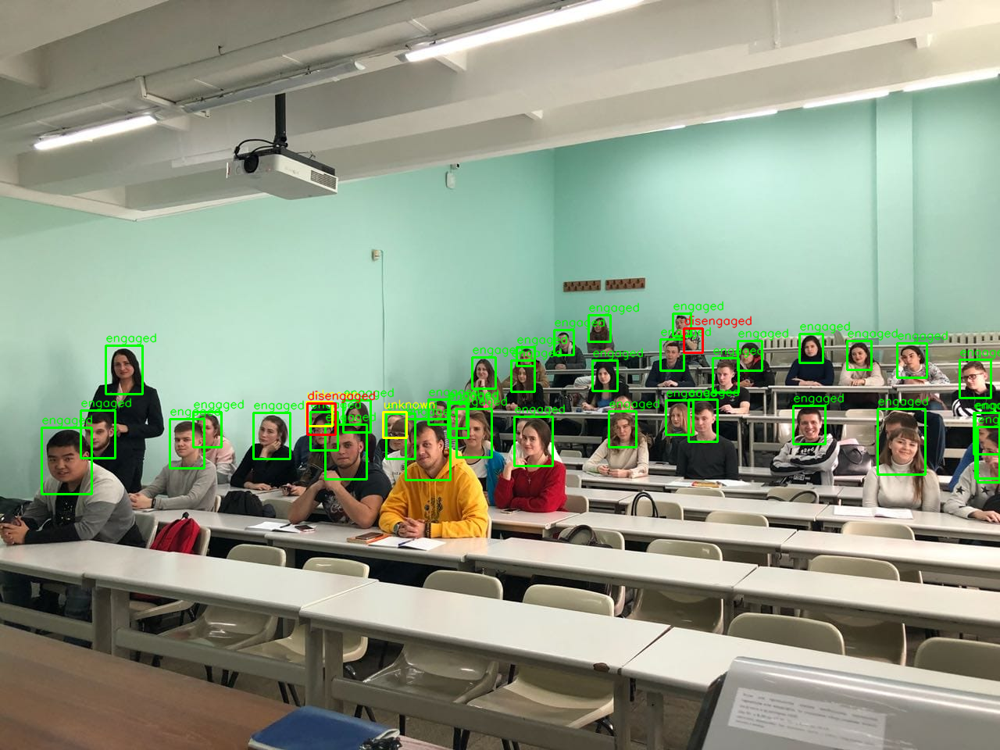

In [51]:
if det_results_df.empty:
    raise RuntimeError("det_results_df пустой. Сначала нужно запустить ячейку 13 и обучить хотя бы один детектор.")

# Лучший детектор по mAP
best_det_row = det_results_df.sort_values("val_mAP50-95", ascending=False).iloc[0]
best_run_name = best_det_row["run_name"]

print("Лучший детектор по val_mAP50-95:")
display(best_det_row.to_frame().T)

BEST_DETECTOR_WEIGHTS = MODELS_DIR / "detector" / best_run_name / "weights" / "best.pt"
print("BEST_DETECTOR_WEIGHTS:", BEST_DETECTOR_WEIGHTS, "| exists:", BEST_DETECTOR_WEIGHTS.exists())

# Лучший классификатор
BEST_CLASSIFIER_ARCH = best_arch
BEST_CLASSIFIER_CKPT = MODELS_DIR / "engagement" / f"engagement_{BEST_CLASSIFIER_ARCH}_best.pt"
print("BEST_CLASSIFIER_CKPT:", BEST_CLASSIFIER_CKPT, "| exists:", BEST_CLASSIFIER_CKPT.exists())

# Загружаем модели
detector = YOLO(str(BEST_DETECTOR_WEIGHTS))
clf_model, clf_ckpt = load_classifier_checkpoint(BEST_CLASSIFIER_CKPT)
class_to_idx = clf_ckpt["class_to_idx"]
idx_to_class = {v: k for k, v in class_to_idx.items()}
print("Классы классификатора:", idx_to_class)

# Трансформация для кропов
inference_transform = eval_transform

def cv2_imread(path: str):

    img = cv2.imread(path)
    return img

def analyze_classroom_image(image_path: str,
                            conf_thres: float = 0.25,
                            min_conf_fallback: float = 0.10):

    print(f"\n=== Анализ изображения: {image_path} ===")
    bgr = cv2_imread(image_path)
    if bgr is None:
        print("Не удалось прочитать изображение")
        return

    vis = bgr.copy()
    h, w = bgr.shape[:2]

    def run_detect(thres):
        res = detector.predict(
            source=[image_path],
            conf=thres,
            device=DEVICE,
            verbose=False,
        )[0]
        return res

    results = run_detect(conf_thres)
    boxes = results.boxes

    if boxes is None or boxes.xyxy.shape[0] == 0:
        if min_conf_fallback is not None and min_conf_fallback < conf_thres:
            print(f"При conf={conf_thres} ничего не найдено, пробуем conf={min_conf_fallback}...")
            results = run_detect(min_conf_fallback)
            boxes = results.boxes

    if boxes is None or boxes.xyxy.shape[0] == 0:
        print("На изображении ничего не найдено детектором даже при пониженном пороге.")
        display(Image.fromarray(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB)))
        return

    num_students    = 0
    num_engaged     = 0
    num_disengaged  = 0
    num_unknown     = 0

    color_teacher    = (255,   0, 255)  # фиолетовый
    color_engaged    = (  0, 255,   0)  # зелёный
    color_disengaged = (  0,   0, 255)  # красный
    color_unknown    = (  0, 255, 255)  # жёлтый

    for box in boxes:
        cls_id = int(box.cls.item())
        x1, y1, x2, y2 = map(int, box.xyxy[0].tolist())
        x1, y1 = max(x1, 0), max(y1, 0)
        x2, y2 = min(x2, w - 1), min(y2, h - 1)

        if cls_id == 1:  # teacher
            cv2.rectangle(vis, (x1, y1), (x2, y2), color_teacher, 2)
            cv2.putText(vis, "teacher", (x1, max(y1 - 5, 0)),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, color_teacher, 1, cv2.LINE_AA)
            continue

        # student
        num_students += 1
        crop = bgr[y1:y2, x1:x2]
        if crop.size == 0:
            continue

        pil_crop = Image.fromarray(cv2.cvtColor(crop, cv2.COLOR_BGR2RGB))
        tensor = inference_transform(pil_crop).unsqueeze(0).to(DEVICE)

        with torch.no_grad():
            logits = clf_model(tensor)
            probs = torch.softmax(logits, dim=1)[0]
            pred_idx = int(torch.argmax(probs).item())
            pred_class = idx_to_class[pred_idx]

        if pred_class == "engaged":
            num_engaged += 1
            color = color_engaged
        elif pred_class == "disengaged":
            num_disengaged += 1
            color = color_disengaged
        else:
            num_unknown += 1
            color = color_unknown

        cv2.rectangle(vis, (x1, y1), (x2, y2), color, 2)
        cv2.putText(vis, pred_class, (x1, max(y1 - 5, 0)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1, cv2.LINE_AA)

    if num_students > 0:
        engagement_ratio_all = num_engaged / num_students
    else:
        engagement_ratio_all = 0.0

    known = num_engaged + num_disengaged
    if known > 0:
        engagement_ratio_known = num_engaged / known
    else:
        engagement_ratio_known = 0.0

    print(f"\nВсего студентов (детектор): {num_students}")
    print(f"  engaged:    {num_engaged}")
    print(f"  disengaged: {num_disengaged}")
    print(f"  unknown:    {num_unknown}")
    print(f"Доля вовлечённых среди всех студентов:          {engagement_ratio_all:.3f}")
    print(f"Доля вовлечённых среди оценённых (без unknown): {engagement_ratio_known:.3f}")

    fname = Path(image_path).name
    display(Markdown(f"**Файл:** `{fname}`"))

    rgb = cv2.cvtColor(vis, cv2.COLOR_BGR2RGB)
    display(Image.fromarray(rgb))

# Несколько случайных изображений из test-сплита детектора
test_dir = DATA_DET / "images" / "test"
test_images = sorted(test_dir.glob("*.*"))
print("Тестовых изображений (детектор):", len(test_images))

if test_images:
    import random
    k = min(1, len(test_images))
    chosen_images = random.sample(test_images, k=k)
    print(f"Случайно выбрано {k} изображений из test:")

    for img_path in chosen_images:
        print("  ", img_path)
        analyze_classroom_image(str(img_path), conf_thres=0.25, min_conf_fallback=0.10)
else:
    print("В test нет картинок.")

# Пользовательские изображения с Google Drive
CUSTOM_INFER_DIR = PROJECT_ROOT / "inference_images"
print("\nCUSTOM_INFER_DIR:", CUSTOM_INFER_DIR, "| exists:", CUSTOM_INFER_DIR.exists())

if CUSTOM_INFER_DIR.exists():
    custom_images = sorted(
        [p for p in CUSTOM_INFER_DIR.glob("*.*")
         if p.suffix.lower() in [".jpg", ".jpeg", ".png"]]
    )
    print("Пользовательских изображений:", len(custom_images))

    for img_path in custom_images:
        analyze_classroom_image(str(img_path), conf_thres=0.25, min_conf_fallback=0.10)
else:
    print("Папка inference_images пока не существует. "
          "Создай её в Google Drive по пути MyDrive/project_alfa_future_final/inference_images "
          "и положи туда свои фото.")

**Модель отлично справляется с задачей в данной конфигурации. Незначительные неточности есть, но их количеством можно пренебречь.**

# Чувствительность модели к искажениям

 Код возвращает новый ImageFolder для заданного сплита с дополнительным искажением и сравнивает метрики на test и test с искажением:
- dark  - затемнение
- blur  - размытие
- noise - добавление шума

In [48]:
def make_perturbed_dataset(split_root: Path, perturb: str = "dark"):

    def transform_fn(img):
        # img: PIL.Image
        img = img.convert("RGB")
        if perturb == "dark":
            # простое затемнение
            arr = np.array(img).astype(np.float32)
            arr = arr * 0.5
            arr = np.clip(arr, 0, 255).astype(np.uint8)
            img = Image.fromarray(arr)
        elif perturb == "blur":
            img = img.filter(ImageFilter.BLUR)
        elif perturb == "noise":
            arr = np.array(img).astype(np.float32)
            noise = np.random.normal(0, 15, arr.shape)
            arr = arr + noise
            arr = np.clip(arr, 0, 255).astype(np.uint8)
            img = Image.fromarray(arr)
        return img

    pert_transform = transforms.Compose([
        transforms.Lambda(transform_fn),
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                             std=[0.229, 0.224, 0.225]),
    ])

    return datasets.ImageFolder(split_root, transform=pert_transform)


def evaluate_sensitivity(model, perturb: str = "dark"):

    print(f"\n=== Sensitivity test, perturb={perturb} ===")

    # обычный test
    m_clean = get_split_metrics(model, test_loader)
    print(f"Test clean: acc={m_clean['acc']:.3f}, macro-F1={m_clean['f1_macro']:.3f}")

    # искажённый test
    pert_test_dataset = make_perturbed_dataset(ENGAGEMENT_ROOT / "test", perturb=perturb)
    pert_test_loader  = DataLoader(pert_test_dataset, batch_size=64, shuffle=False, num_workers=2)
    m_pert = get_split_metrics(model, pert_test_loader)
    print(f"Test {perturb}: acc={m_pert['acc']:.3f}, macro-F1={m_pert['f1_macro']:.3f}")

evaluate_sensitivity(best_model, perturb="dark")
evaluate_sensitivity(best_model, perturb="blur")
evaluate_sensitivity(best_model, perturb="noise")


=== Sensitivity test, perturb=dark ===
Test clean: acc=0.766, macro-F1=0.762
Test dark: acc=0.733, macro-F1=0.727

=== Sensitivity test, perturb=blur ===
Test clean: acc=0.766, macro-F1=0.762
Test blur: acc=0.618, macro-F1=0.616

=== Sensitivity test, perturb=noise ===
Test clean: acc=0.766, macro-F1=0.762
Test noise: acc=0.664, macro-F1=0.650


- **Затемнение (dark)**. При затемнении точность падает с 0.766 до 0.733, macro-F1 — с 0.762 до 0.727. Это небольшое снижение (примерно 4–5 процентных пункта), значит модель довольно устойчиво переживает ухудшение освещённости: общая структура лиц и поз остаётся различимой, и классификатор по-прежнему делает близкие к исходным предсказания.

- **Размытие (blur)**. При размытии точность падает сильнее всего — с 0.766 до 0.618, macro-F1 с 0.762 до 0.616. Это уже заметная деградация (потеря ~15 процентных пунктов), что показывает высокую чувствительность модели к разфокусировке и смазыванию. Ключевые детали лица и взгляда размываются, поэтому модель значительно хуже различает engaged / disengaged / unknown.

- **Шум (noise)**. При добавлении шума метрики падают до acc = 0.664 и macro-F1 = 0.650 — хуже, чем при затемнении, но лучше, чем при размытии. То есть случайный шум мешает модели, но не критично: она всё ещё способна выделять главное на изображении, хотя уверенность и качество предсказаний заметно снижаются по сравнению с чистым тестом.

# Итоговый вывод:

1. Разработан и реализован опытный образец системы компьютерного зрения, предназначенной для автоматизированной оценки посещаемости и вовлеченности обучающихся по статическим изображениям учебных аудиторий. Система опирается на требования технического задания, решает задачи детекции обучающихся и последующей классификации их состояния вовлеченности и обеспечивает формирование агрегированных показателей по каждому кадру.

2. В рамках проекта сформирован верифицированный датасет фотографий аудиторий с разметкой bounding box для каждого обучающегося и разметкой уровней вовлеченности («engaged», «disengaged», «unknown»). Данные разделены по исходным фотографиям на обучающую, валидационную и тестовую выборки в пропорции 70/15/15, что исключает утечки между сплитами. Обучение всех моделей выполнено на GPU с использованием Python-стека (PyTorch, Ultralytics YOLO, OpenCV, Pandas, Matplotlib и др.), с применением стандартных аугментаций и нормализации изображений.

3. Архитектура системы построена по двухэтапной схеме. На первом этапе применяется детектор YOLO (варианты yolo11n/yolo11s), обученный выделять на изображении объекты классов «student» и «teacher» и обеспечивающий наилучшее качество на валидации при приемлемой скорости обработки кадров. На втором этапе поверх кропов с головами студентов работает классификатор вовлеченности на базе сверточной сети ResNet34, показавший наилучший баланс качества по метрике macro-F1 на валидационной и тестовой выборках по сравнению с другими протестированными архитектурами (ResNet18/50, MobileNetV3-Small, EfficientNet-B0, логистическая регрессия).

4. Качество детекции оценивается по стандартным метрикам mAP@0.5 и mAP@0.5:0.95, а качество классификации – по accuracy и macro-F1, что соответствует требованиям технического задания и учитывает возможный дисбаланс классов. Дополнительно проведён стресс-тест чувствительности классификатора к ухудшению качества изображений (затемнение, размытие, шум), что показало устойчивость модели к изменению освещённости и шуму и более высокую уязвимость к сильному размытию, что важно для планирования дальнейшего расширения датасета и аугментаций.

5. Система реализует требуемый функционал: пакетную загрузку изображений, предобработку, детекцию и классификацию, расчёт числа студентов и доли вовлечённых, визуализацию результатов на изображении (рамки и классы) и формирование сводных метрик. Предусмотрен модуль инференса для пользовательских фотографий и возможность дообучения моделей при появлении новых размеченных данных. В целом, разработанный прототип соответствует ключевым требованиям технического задания и может служить основой для дальнейшего промышленного развития системы аналитики вовлечённости в образовательном процессе.